# Test advanced masking for percipitation 

- author: Johannes L. Fjeldså
- email: johannes.larsen.fjeldså@nmbu.no

## Import libraries

In [5]:
import numpy as np

import matplotlib.pyplot as plt

from xclim import ensembles as ens

from src.preproces import *
from src.plotting import *
from src.create_masked_climatology import *
from pathlib import Path


file_handler = Handle_Files()
var = 'pr'
main_data_folder = '/nird/home/johannef/Masterthesis_S23 DataFiles/Annualclimatologies/nomask/' + var
SSPs = ['ssp126', 'ssp245', 'ssp370', 'ssp585']

## Create file-compatible masking

### Identify regions to mask 

The global masking of percipitation with intermask meanscaling is shown bellow. 

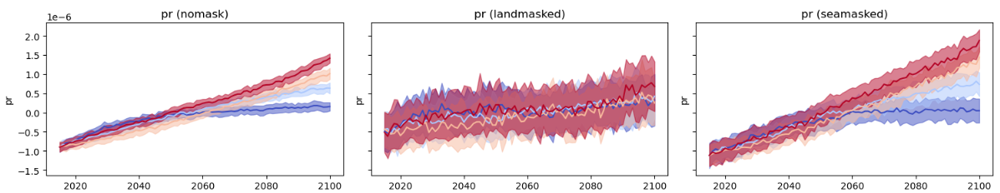

For early emerging signal this is quite unusable since the ensambles are at large overlapping as well as the means being close. Examining the [ipcc interactive atlas](https://interactive-atlas.ipcc.ch/regional-information#eyJ0eXBlIjoiQVRMQVMiLCJjb21tb25zIjp7ImxhdCI6LTMwNzYzOTAsImxuZyI6MjMxNzIzLCJ6b29tIjozLCJwcm9qIjoiRVBTRzo1NDAzMCIsIm1vZGUiOiJjb21wbGV0ZV9hdGxhcyJ9LCJwcmltYXJ5Ijp7InNjZW5hcmlvIjoic3NwMTI2IiwicGVyaW9kIjoibmVhciIsInNlYXNvbiI6InllYXIiLCJkYXRhc2V0IjoiQ01JUDYiLCJ2YXJpYWJsZSI6InByIiwidmFsdWVUeXBlIjoiUkVMQVRJVkVfQU5PTUFMWSIsImhhdGNoaW5nIjoiU0lNUExFIiwicmVnaW9uU2V0IjoiYXI2IiwiYmFzZWxpbmUiOiJwcmVJbmR1c3RyaWFsIiwicmVnaW9uc1NlbGVjdGVkIjpbXX0sInBsb3QiOnsiYWN0aXZlVGFiIjoicGx1bWUiLCJtYXNrIjoibm9uZSIsInNjYXR0ZXJZTWFnIjpudWxsLCJzY2F0dGVyWVZhciI6bnVsbCwic2hvd2luZyI6ZmFsc2V9fQ==) with the %-change of the total percipititaion (*pr*) variable agregated from CMIP6 model ensambles we get the figs shown bellow


In [ ]:
disp_external_fig('/nird/home/johannef/Masterthesis_S23/External figs/CMIP6 - Total precipitation (PR) Change % - Near Term (2021-2040) SSP5-8.5 (rel. to 1850-1900) - Annual (33 models).png',
                  wanted_height=6)

In [ ]:
disp_external_fig('/nird/home/johannef/Masterthesis_S23/External figs/CMIP6 - Total precipitation (PR) Change % - Near Term (2021-2040) SSP1-2.6 (rel. to 1850-1900) - Annual (31 models).png',
                  wanted_height=6)

From these figs it seems to be a good starting point to investigete around the equator $\pm 30 ^\circ$. It is inportant to note that the scrambled areas are areas with low model agreement, in our model there will be a signal in these areas as well. 

In order to actually investigate areas with stronger diverging signals we will plot the inter SSP anamonlies of the SSP-ensamblemean from the annual climatologies.

In [2]:
ensambles = {scenario: ens.create_ensemble(Path(main_data_folder + '/' + scenario).glob("*.nc")) for scenario in SSPs}

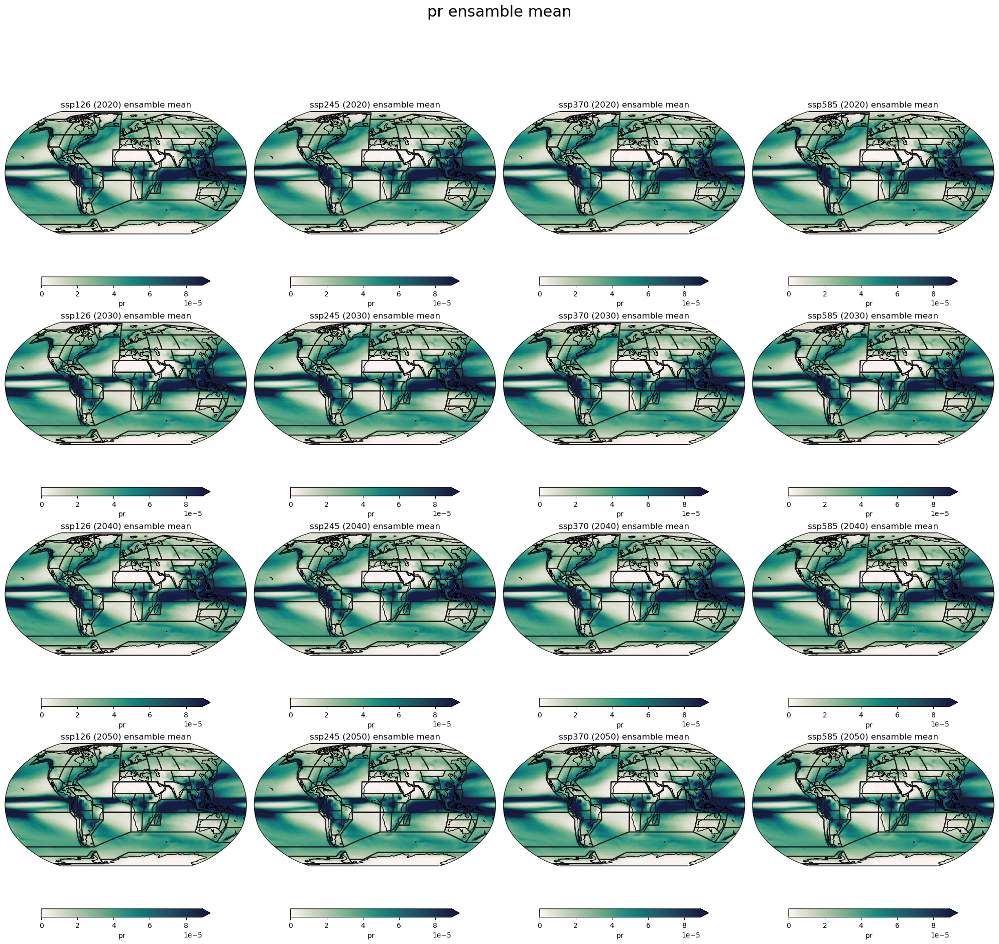

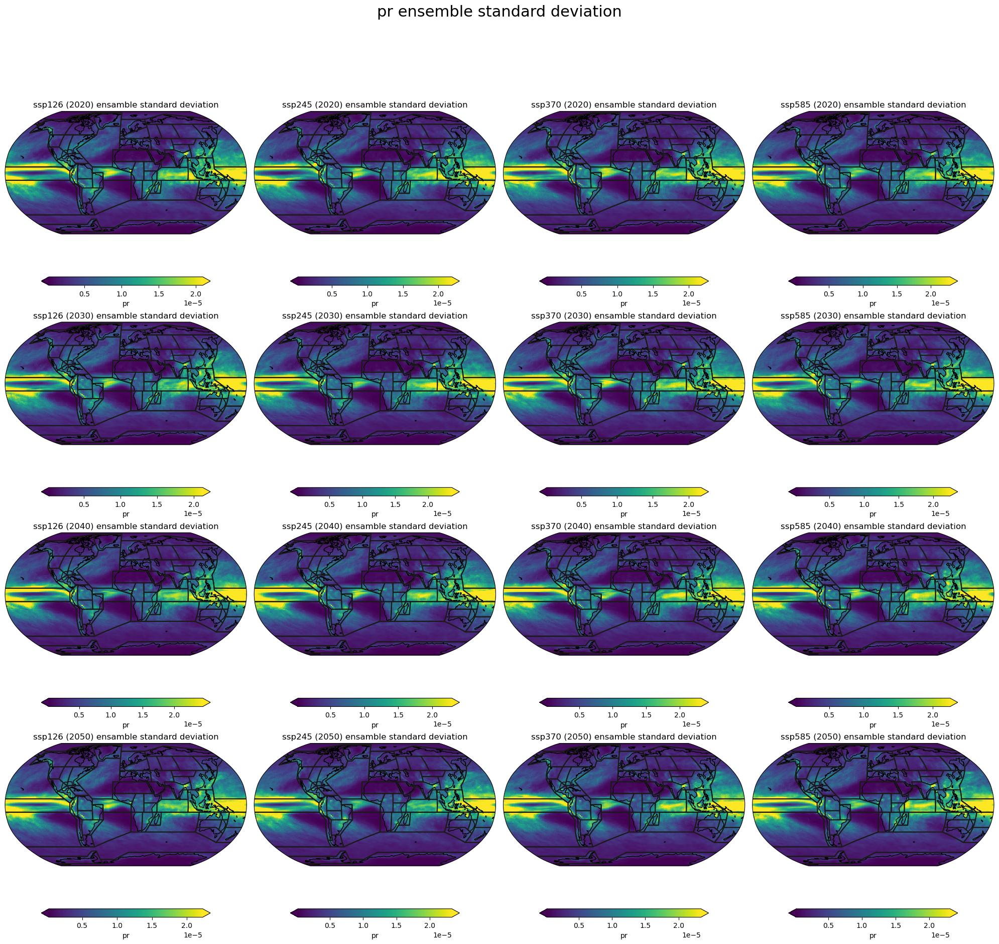

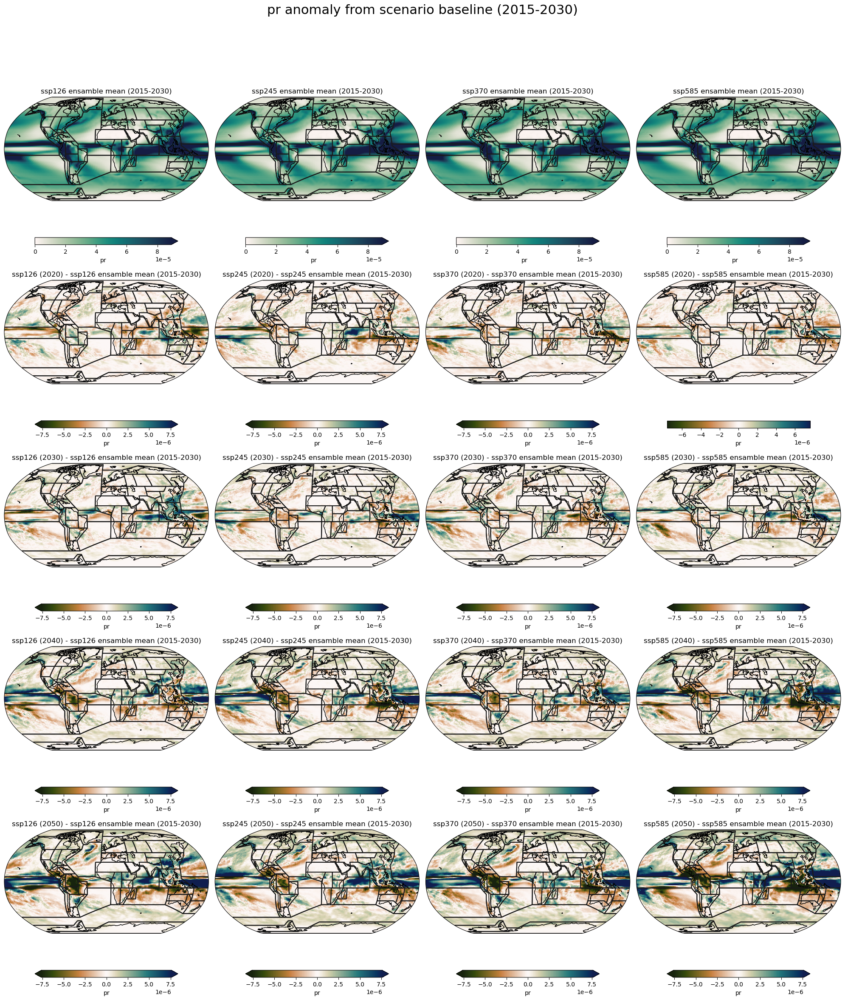

In [3]:
plot_mapplots_for_investigation(ensambles, var, [2020, 2030, 2040, 2050], SSPs)

From the plots there are some regions that are more interesting then others. I will use global mean as baseline to compare with:
- $\pm 30 ^\circ$ from equator: nomask, landmask, seamask
- $\pm 15 ^\circ$ from equator: nomask, landmask, seamask
- Reduksjon nedbør: SIO, SPO, SAO,
- Økning nedbør: EPO, EIO
- Områder som ser ut til å ha store forskjeller: SCA, CAR, NAO, EOA

An interesting approch would be to calculate the Signal to noise ratio (SNR) using $\Delta \operatorname{pr}$ from the 2015-2030 period and fining the regression line. From this one could find the mean and standard deviation. The SNR could then act as a mask layer in order to easier detect areas with high SNR and high inter-SSP variance.

## Create masks 

Start by importing a test file: 

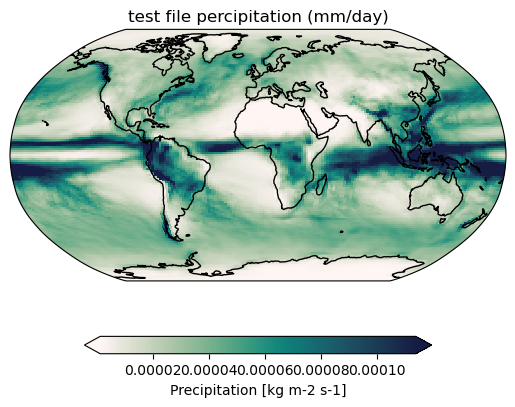

In [8]:
test_file = file_handler.read_netcdf_to_xr('/nird/home/johannef/Masterthesis_S23 DataFiles/Annualclimatologies/nomask/pr/ssp126/pr_yr_ACCESS-ESM1-5_ssp126_r1i1p1f1_gn_2015-2100.nc')
plot_on_map(test_file.isel(year=0).pr, title='test file percipitation (mm/day)', percipitation='abs')

In [3]:
land_mask = agregate_land_sea_mask(land=True, test_file=test_file, var='pr')
file_handler.save_dataset_to_netcdf(land_mask, 'land_mask_ACCESS-ESM1-5.nc', '/nird/home/johannef/Masterthesis_S23 DataFiles/masks')
sea_mask = agregate_land_sea_mask(sea=True, test_file=test_file, var='pr')
file_handler.save_dataset_to_netcdf(sea_mask, 'sea_mask_ACCESS-ESM1-5.nc', '/nird/home/johannef/Masterthesis_S23 DataFiles/masks')

/nird/home/johannef/.conda/msc_env/lib/python3.11/site-packages/xarray/coding/times.py:154: SerializationWarning: Ambiguous reference date string: 1-01-01 01:00:00. The first value is assumed to be the year hence will be padded with zeros to remove the ambiguity (the padded reference date string is: 0001-01-01 01:00:00). To remove this message, remove the ambiguity by padding your reference date strings with zeros.
  warnings.warn(warning_msg, SerializationWarning)
/nird/home/johannef/.conda/msc_env/lib/python3.11/site-packages/xarray/coding/times.py:724: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/nird/home/johannef/.conda/msc_env/lib/python3.11/site-packages/xarray/core/indexing.py:557: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftim

'/nird/home/johannef/Masterthesis_S23 DataFiles/masks/sea_mask_ACCESS-ESM1-5.nc'

In [6]:
land_mask = open_landmask()
sea_mask = open_seamask()

We will start with raw latitude masking with no land-sea masking:

In [9]:
lat_mask_pm15deg = create_latitude_mask(min_lat=-15, max_lat=15, var='pr', new_mask_name='lat_mask_pm15deg', test_file=test_file)
lat_mask_pm30deg = create_latitude_mask(min_lat=-30, max_lat=30, var='pr', new_mask_name='lat_mask_pm30deg', test_file=test_file)
lat_mask_0_30N = create_latitude_mask(min_lat=0, max_lat=30, var='pr', new_mask_name='lat_mask_0_30N', test_file=test_file)
lat_mask_30S_0 = create_latitude_mask(min_lat=-30, max_lat=0, var='pr', new_mask_name='lat_mask_30S_0', test_file=test_file)

Moving on to latitude masking with land-sea masking:

In [10]:
land_mask_pm15deg = create_land_sea_latitude_mask(min_lat=-15, max_lat=15, new_mask_name='land_mask_pm15deg',  land=True)
land_mask_pm30deg = create_land_sea_latitude_mask(min_lat=-30, max_lat=30, new_mask_name='land_mask_pm30deg',land=True)
sea_mask_pm15deg = create_land_sea_latitude_mask(min_lat=-15, max_lat=15, new_mask_name='sea_mask_pm15deg', sea=True)
sea_mask_pm30deg = create_land_sea_latitude_mask(min_lat=-30, max_lat=30, new_mask_name='sea_mask_pm30deg', sea=True)

Further we need to apply the area masks identified previously.

In [11]:
pr_decrease_regions = ['SIO', 'SPO', 'SAO']
pr_increase_regions = ['EPO', 'EIO']
pr_large_deviation_regions = ['SCA', 'CAR', 'NAO', 'EAO']
pr_decrease_mask = create_mask_from_AR6_abriviations(pr_decrease_regions, var, 'pr_decrease_mask', test_file)
pr_increase_mask = create_mask_from_AR6_abriviations(pr_increase_regions, var, 'pr_increase_mask', test_file)
pr_large_deviation_mask = create_mask_from_AR6_abriviations(pr_large_deviation_regions, var, 'pr_large_deviation_mask', test_file)

Now We plot the test_file with the masks

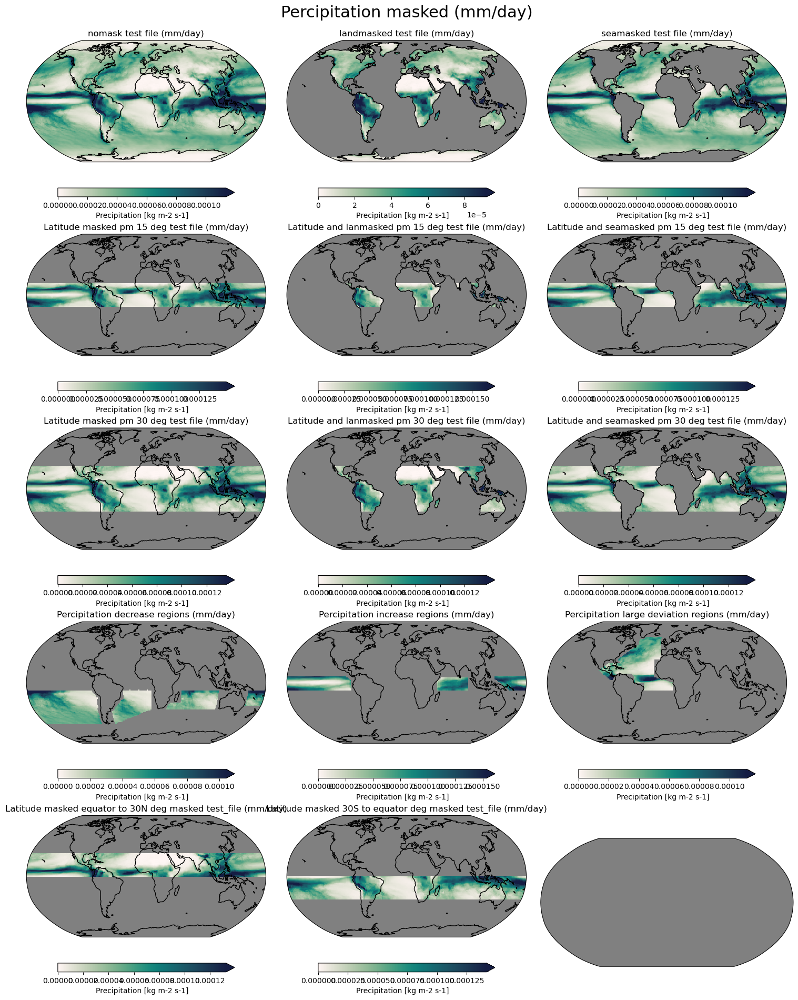

In [12]:
fig, axs = plt.subplots(nrows=5, ncols=3, figsize=(15, 20), 
                        subplot_kw=dict(projection=ccrs.Robinson(central_longitude=0), facecolor="gray"))
fig.suptitle('Percipitation masked (mm/day)', fontsize=22)

plot_data = {'nomask test file (mm/day)': test_file.isel(year=0).pr,
             'landmasked test file (mm/day)': test_file.where(land_mask.mask).isel(year=0).pr,
             'seamasked test file (mm/day)':  test_file.where(sea_mask.mask).isel(year=0).pr,
             'Latitude masked pm 15 deg test file (mm/day)': test_file.where(lat_mask_pm15deg.mask).isel(year=0).pr,
             'Latitude and lanmasked pm 15 deg test file (mm/day)': test_file.where(land_mask_pm15deg.mask).isel(year=0).pr,
             'Latitude and seamasked pm 15 deg test file (mm/day)': test_file.where(sea_mask_pm15deg.mask).isel(year=0).pr,
             'Latitude masked pm 30 deg test file (mm/day)': test_file.where(lat_mask_pm30deg.mask).isel(year=0).pr,
             'Latitude and lanmasked pm 30 deg test file (mm/day)': test_file.where(land_mask_pm30deg.mask).isel(year=0).pr,
             'Latitude and seamasked pm 30 deg test file (mm/day)': test_file.where(sea_mask_pm30deg.mask).isel(year=0).pr,
             'Percipitation decrease regions (mm/day)': test_file.where(pr_decrease_mask.mask).isel(year=0).pr,
             'Percipitation increase regions (mm/day)': test_file.where(pr_increase_mask.mask).isel(year=0).pr,
             'Percipitation large deviation regions (mm/day)': test_file.where(pr_large_deviation_mask.mask).isel(year=0).pr,
             'Latitude masked equator to 30N deg masked test_file (mm/day)': test_file.where(lat_mask_0_30N.mask).isel(year=0).pr,
             'Latitude masked 30S to equator deg masked test_file (mm/day)': test_file.where(lat_mask_30S_0.mask).isel(year=0).pr}

axs = axs.flatten()

for (title, data), ax in zip(plot_data.items(), axs):
    plot_on_map(data, ax, 
                title=title, 
                v_min=0,
                percipitation='abs')
                
plt.tight_layout(rect=[0, 0.03, 1, .98])  # Adjust the rect parameter to position the suptitle
plt.show()

In [13]:
save_dir = '/nird/home/johannef/Masterthesis_S23 DataFiles/masks'
for mask in [lat_mask_pm30deg, lat_mask_pm15deg,
             lat_mask_0_30N, lat_mask_30S_0, 
             land_mask_pm15deg, land_mask_pm30deg, 
             sea_mask_pm15deg, sea_mask_pm30deg, 
             pr_decrease_mask, pr_increase_mask, pr_large_deviation_mask]:
    save_name = mask.mask_name + '_ACCESS-ESM1-5.nc'
    file_handler.save_dataset_to_netcdf(mask, save_name, save_dir)

We now have usable masks, these needs to be applied in bulk

In [17]:
for mask_name in ['lat_mask_pm30deg', 'lat_mask_pm15deg', 'lat_mask_0_30N', 'lat_mask_30S_0', 
                  'land_mask', 'land_mask_pm15deg', 'land_mask_pm30deg', 
                  'sea_mask', 'sea_mask_pm15deg', 'sea_mask_pm30deg', 
                  'pr_decrease_mask','pr_increase_mask', 'pr_large_deviation_mask']:
    create_masked_climatologies(mask_name, var,
                                excisting_mask=True)

Lets investigate the ensambles

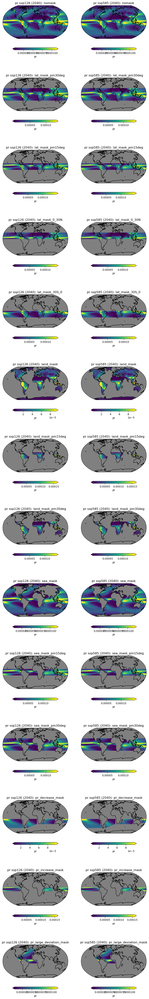

In [18]:
main_data_dir = '/nird/home/johannef/Masterthesis_S23 DataFiles/Annualclimatologies'
SSPs = ['ssp126', 'ssp585']
var = 'pr'
mask_names = ['nomask', 'lat_mask_pm30deg', 'lat_mask_pm15deg', 
              'lat_mask_0_30N', 'lat_mask_30S_0',
              'land_mask', 'land_mask_pm15deg','land_mask_pm30deg', 
              'sea_mask', 'sea_mask_pm15deg', 'sea_mask_pm30deg', 
              'pr_decrease_mask','pr_increase_mask', 'pr_large_deviation_mask']
fig, axs = plt.subplots(ncols=len(SSPs), nrows=len(mask_names), 
                        figsize=(5*len(SSPs), 5*len(mask_names)),
                        subplot_kw=dict(projection=ccrs.Robinson(central_longitude=0), facecolor="gray"))
axs = axs.flatten()

i = 0
for mask_name in mask_names:
    mask_data_dir = '/'.join([main_data_dir, mask_name, var])
    for scenario in SSPs:
        data_dir = '/'.join([mask_data_dir, scenario])
        ensamble = ens.create_ensemble(Path(data_dir).glob("*.nc")) 
        ensamble_mean = ensamble.mean(dim='realization') 

        plot_on_map(ensamble_mean.sel(year=2040)[var], ax=axs[i], title=f'{var} {scenario} ({2040}): {mask_name}')

        i += 1

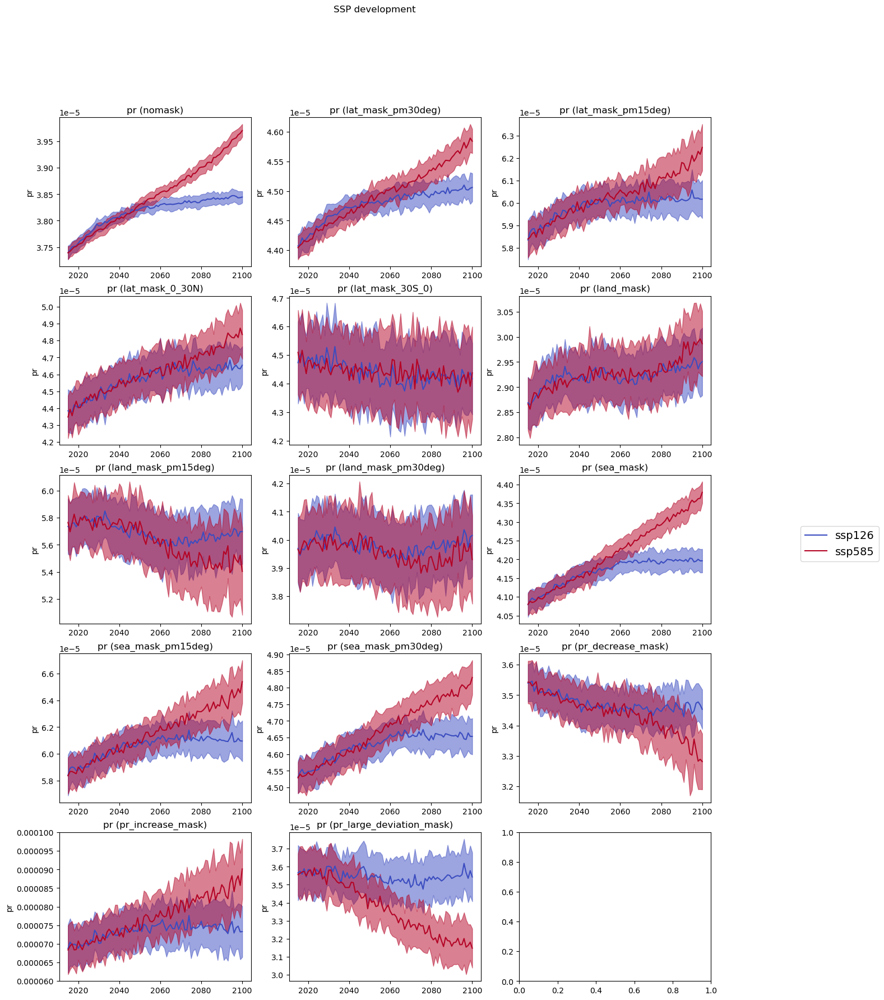

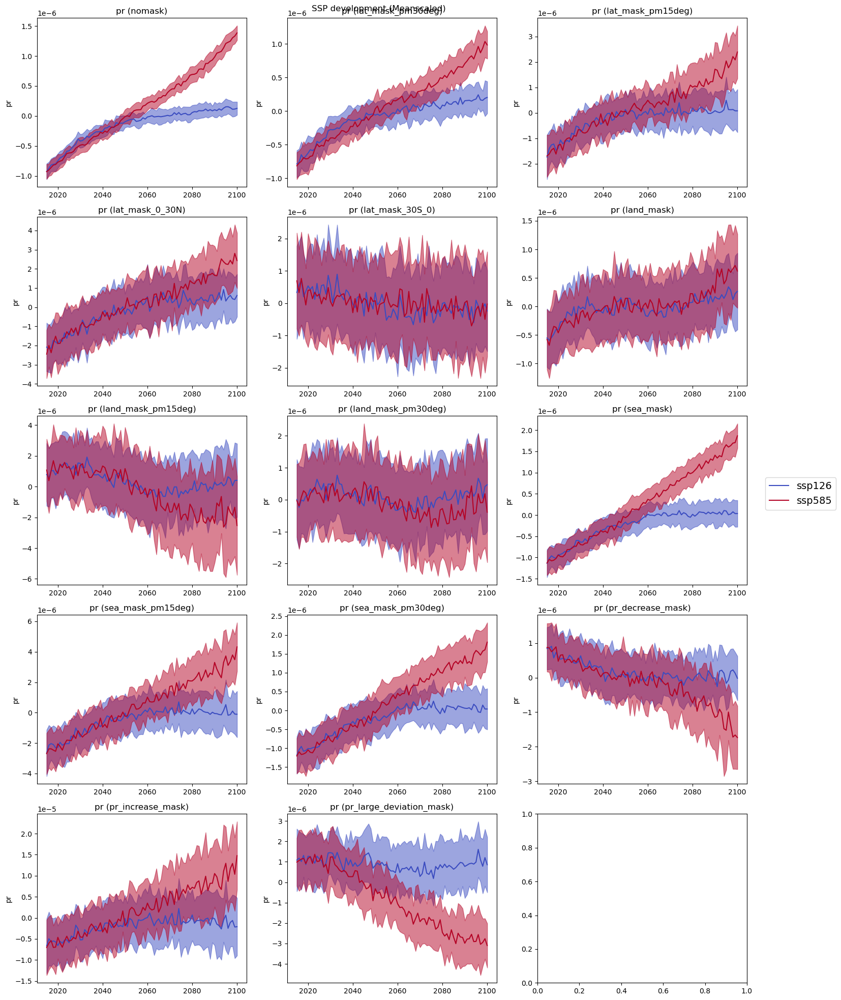

In [19]:
main_data_dir = '/nird/home/johannef/Masterthesis_S23 DataFiles/AnnualGlobalClimatologies'
plot_annual_global_ensambles(main_data_dir, SSPs, var,
                             mask_names)

The ensamble time series show that many of these maskings has a lower SNR then the original masking. I therefore delete the files. However the masks are still available.
I will keep climatologies from:
- nomask
- seamask
- landmask
- seamask pm 30 deg
- pr large deviation mask (['SCA', 'CAR', 'NAO', 'EAO'])